In [155]:
import pandas as pd
import seaborn as sb
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import h5py
import datetime
import data_layout
import graph_utils
from IPython.display import Video

In [65]:
#the paths to different data
#assumes you unzipped the berlin.tar
# static = 'BERLIN/BERLIN_static.h5'
# temporal = 'BERLIN/BERLIN_test_temporal.h5'
# additional_temporal = 'BERLIN/BERLIN_test_additional_temporal.h5'
map_high_res_berlin = 'BERLIN/BERLIN_map_high_res.h5'
training_berlin = 'BERLIN/training/'

In [40]:
static = 'ANTWERP/ANTWERP_static.h5'
map_high_res = 'ANTWERP/ANTWERP_map_high_res.h5'
training = 'ANTWERP/training/'

In [41]:
#function to open h5 file and return data as numpy array
def open_file(file_path):
    fr = h5py.File(file_path, 'r')
    a_group_key = list(fr.keys())[0]
    data = list(fr[a_group_key])
    # transform to appropriate numpy array 
    data=data[0:]
    data = np.stack(data, axis=0)
    return data

Static Data Analysis

In [66]:
static_data = open_file(static)
map_data = open_file(map_high_res)
map_data_berlin = open_file(map_high_res_berlin)

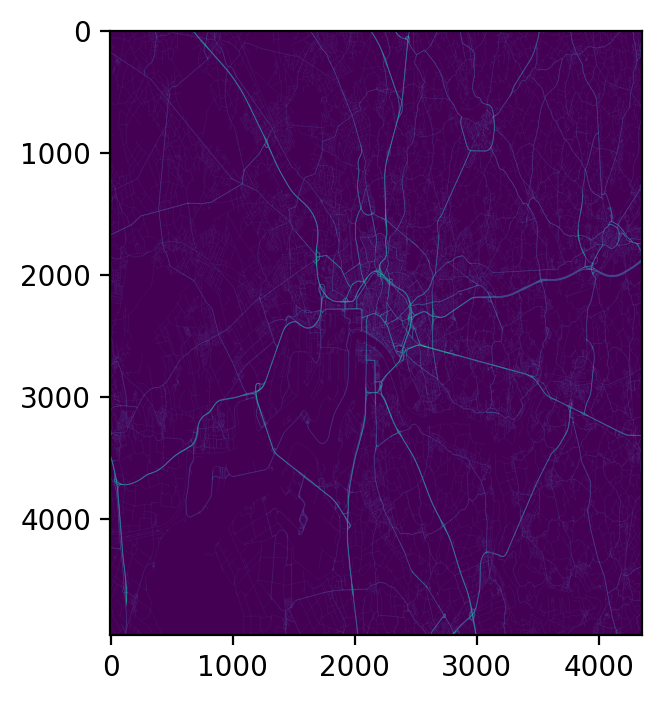

In [67]:
fig = plt.figure(dpi=200)
plt.imshow(map_data)

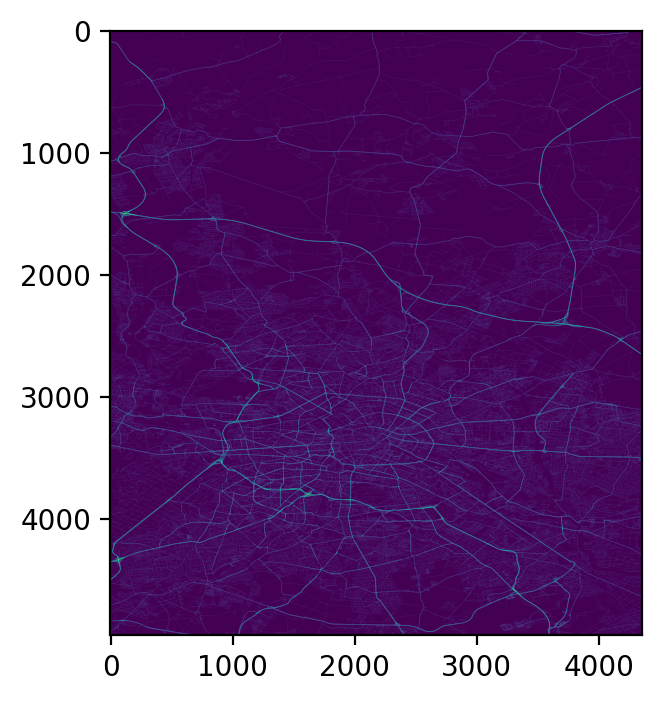

In [68]:
fig = plt.figure(dpi=200)
plt.imshow(map_data_berlin)

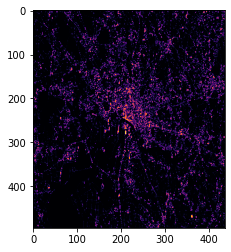

In [143]:
neighborhood_degrees = np.sum(static_data[1:, :, :] / 255, axis=(0))
plt.imshow(np.exp(neighborhood_degrees), cmap="inferno")

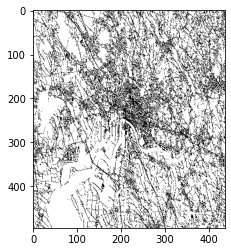

In [152]:
plt.imshow(static_data[8], cmap="gray_r", vmin=0, vmax=255)

In [160]:
graph = graph_utils.reconstruct_graph(static_data, 'ANTWERP')
graph_image = graph_utils.poor_man_graph_visualization(graph)

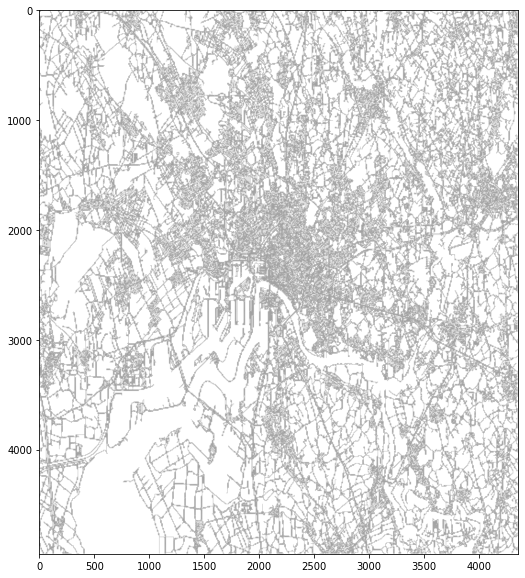

In [172]:
plt.figure(figsize = (10,10))
plt.imshow(graph_image, cmap="gray_r")

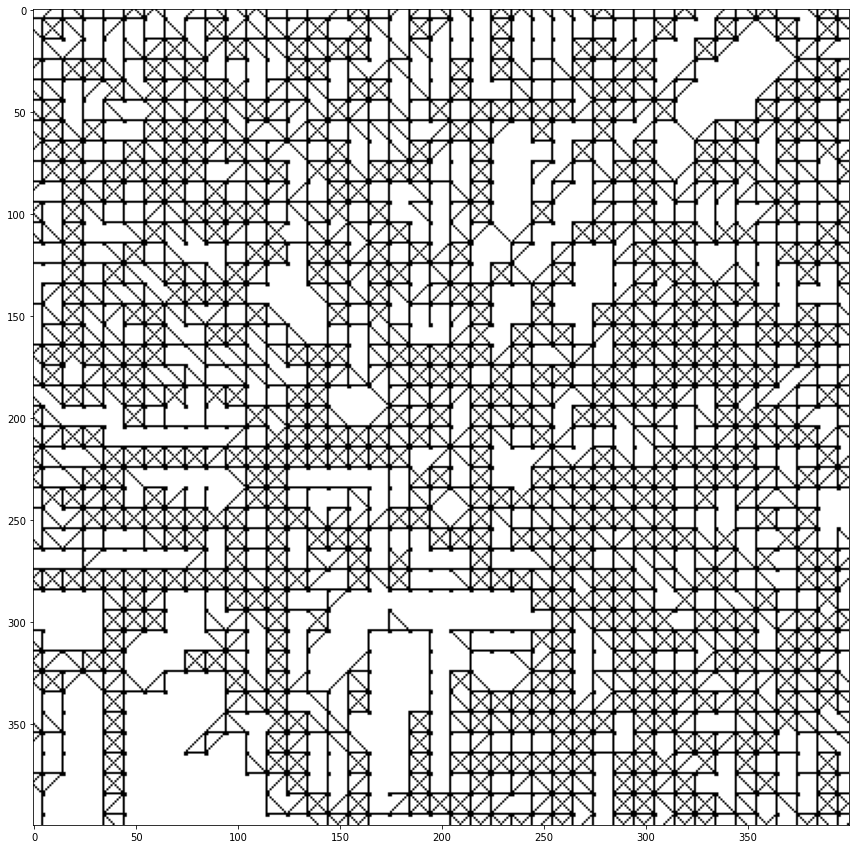

In [174]:
plt.figure(figsize = (15,15))
plt.imshow(graph_image[2000:2400, 1800:2200], cmap="gray_r")

In [177]:
graph.number_of_nodes()

113755

In [178]:
graph.edges()

EdgeView([((1, 0), (0, 0)), ((1, 0), (0, 1)), ((1, 0), (1, 1)), ((0, 0), (0, 1)), ((0, 0), (1, 1)), ((1, 1), (0, 1)), ((0, 1), (0, 2)), ((1, 10), (0, 10)), ((1, 10), (2, 10)), ((1, 10), (0, 9)), ((1, 10), (2, 11)), ((0, 10), (0, 9)), ((1, 17), (0, 17)), ((1, 17), (0, 18)), ((1, 17), (1, 18)), ((1, 17), (2, 18)), ((0, 17), (0, 18)), ((0, 17), (1, 18)), ((1, 18), (0, 18)), ((1, 18), (2, 18)), ((1, 18), (2, 19)), ((1, 22), (0, 22)), ((1, 22), (1, 21)), ((0, 22), (1, 21)), ((1, 27), (0, 27)), ((1, 27), (2, 27)), ((1, 27), (1, 28)), ((1, 27), (2, 28)), ((0, 27), (1, 28)), ((1, 31), (0, 31)), ((1, 31), (2, 31)), ((1, 31), (0, 32)), ((1, 31), (1, 32)), ((1, 31), (2, 32)), ((0, 31), (1, 32)), ((1, 32), (0, 32)), ((1, 33), (0, 33)), ((1, 33), (2, 33)), ((1, 34), (0, 34)), ((1, 34), (2, 34)), ((1, 34), (1, 35)), ((1, 34), (2, 35)), ((0, 34), (0, 35)), ((1, 35), (0, 35)), ((1, 35), (2, 35)), ((1, 35), (0, 36)), ((1, 35), (2, 34)), ((1, 35), (1, 36)), ((0, 35), (0, 36)), ((0, 35), (1, 36)), ((1, 3

In [ ]:
map_high_res_berlin = open_file(map_high_res_berlin)
map_high_res_ist = open_file(map_high_res_ist)
map_high_res_chi = open_file(map_high_res_chi)
map_high_res_mel = open_file(map_high_res_mel)

map_high_res_bang = open_file(map_high_res_bang)
map_high_res_bar = open_file(map_high_res_bar)

print(np.count_nonzero(map_high_res_bang))
print(np.count_nonzero(map_high_res_bar))
print(np.count_nonzero(map_high_res_berlin))
print(np.count_nonzero(map_high_res_ist))
print(np.count_nonzero(map_high_res_chi))
print(np.count_nonzero(map_high_res_mel))

"""
output:
5511799
2660217
2763148
2706869
5167663
2979426
"""

Training Data Analysis

In [122]:
training_data_antwerp = open_file('ANTWERP/training/2019-02-06_ANTWERP_8ch.h5')

In [107]:
training_data_berlin = open_file('BERLIN/training/2019-02-06_BERLIN_8ch.h5')

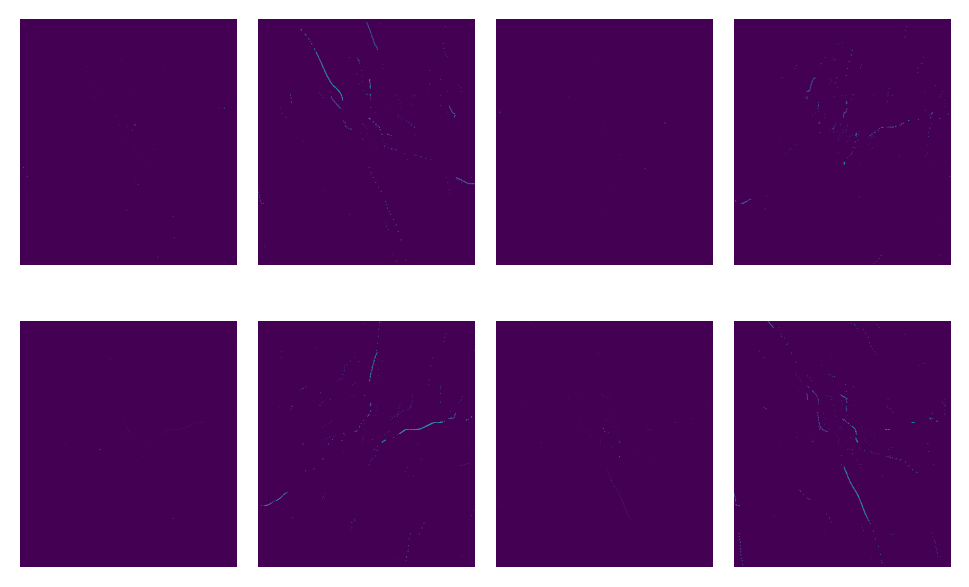

In [71]:
def plot_training_data(index):
    #plots speeds and volumes for each of the direction (north-east, south-east, south-west, north-west)

    number_of_channels = 8

    num_rows = 2
    num_cols = 4

    fig = plt.figure(dpi=200)
    gs = matplotlib.gridspec.GridSpec(num_rows, num_cols, wspace=0.1)

    ax = [plt.subplot(gs[i]) for i in range(num_rows*num_cols)]
    gs.update(hspace=0)

    for i in range(number_of_channels):
        ax[i].imshow(training_data_antwerp[index, :, :, i])
        ax[i].axis('off')

    plt.show()

plot_training_data(1)


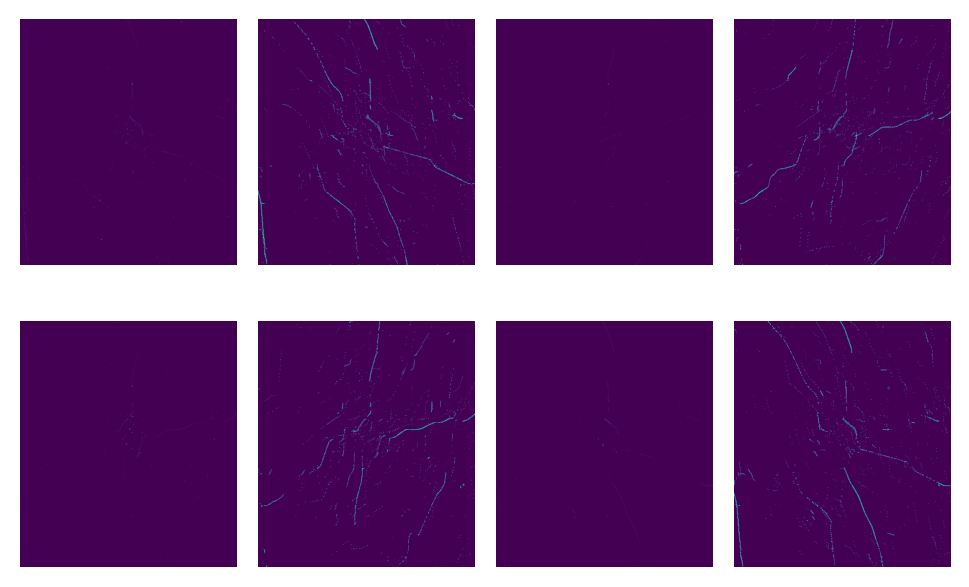

In [72]:
plot_training_data(188)

In [52]:
Video('ANTWERP_0110.mp4', embed=True)

In [53]:
Video('antwerp_0410.mp4', embed=True)

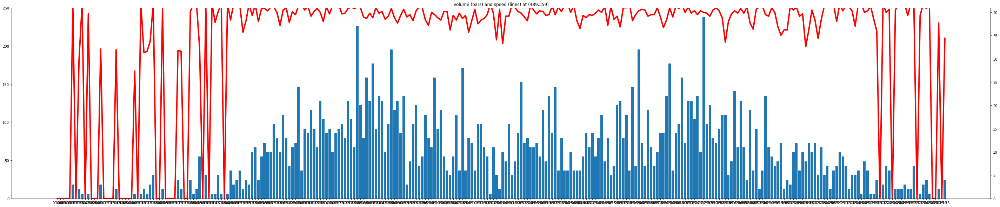

In [108]:
def plot_volume_and_speed(x, y, data):
    fig, ax1 = plt.subplots(figsize=(50, 10))
    ax1.set_ylim([0, 250])
    ax1.set_title(f"volume (bars) and speed (lines) at ({x},{y})")
    x_labels = [datetime.time(hour=t // 12, minute=t % 12 * 5).isoformat(timespec="minutes") for t in range(288)]
    # ax1.set_xticks(rotation=90)
    ax1.plot(x_labels, data[:, x, y, 1], linewidth=4, color="red")
    ax2 = ax1.twinx()
    ax2.bar(x_labels, data[:, x, y, 0])
    
    plt.show()


plot_volume_and_speed(489, 359, training_data_berlin)

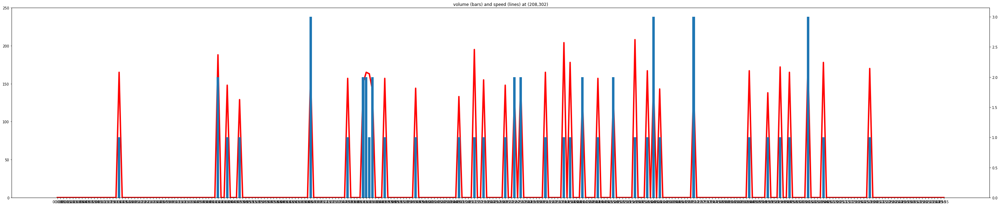

In [106]:
plot_volume_and_speed(208, 302, training_data_antwerp_covid)

Average Volume Values Covid vs Non-Covid

In [109]:
training_data_antwerp_covid = open_file('ANTWERP/training/2020-04-10_ANTWERP_8ch.h5')

In [132]:
def calc_means(data):
    means = []
    for imgs in range(288):
        mean_ne = np.mean(data[imgs, :, :, 1])
        mean_se = np.mean(data[imgs, :, :, 3])
        mean_sw = np.mean(data[imgs, :, :, 5])
        mean_nw = np.mean(data[imgs, :, :, 7])
        means.append(np.mean([mean_ne, mean_se, mean_sw, mean_nw]))
    return means

means_precovid = calc_means(training_data_antwerp)
means_covid = calc_means(training_data_antwerp_covid)

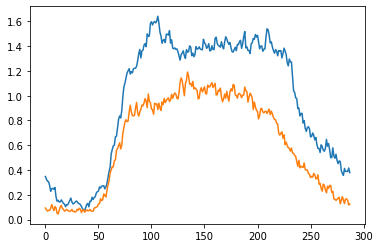

In [135]:
plt.plot(means_precovid)
plt.plot(means_covid)
plt.show()